In [1]:
import json
import pathlib
import pickle

import matplotlib.pyplot as plt
import numpy as np
import torch
from diffusers.models import AutoencoderKL
from diffusers import StableDiffusionPipeline

from tqdm import tqdm

from helper import read_set_list
import src.utils.image as im_utils
import src.utils.model as model_utils
import src.utils.plot as plot_utils
from src import experiments

from importlib import reload

/visinf/home/lab_mozkan/computer-vision-proj-lab/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


RuntimeError: Failed to import diffusers.models.autoencoders.autoencoder_kl because of the following error (look up to see its traceback):
Failed to import diffusers.loaders.single_file_model because of the following error (look up to see its traceback):
Could not import module 'AutoImageProcessor'. Are this object's requirements defined correctly?

In [2]:
toyplane_dir = pathlib.Path(
    "/visinf/home/lab_mozkan/computer-vision-proj-lab/data/co3d_data/toyplane"
)
set_list = read_set_list(
    toyplane_dir.joinpath("set_lists", "set_lists_manyview_test_0.json")
)

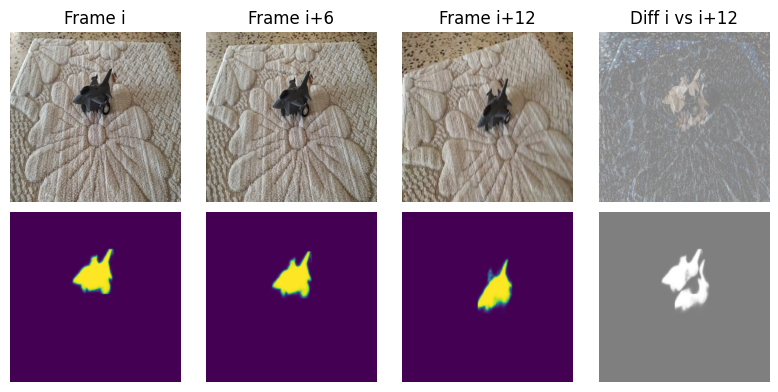

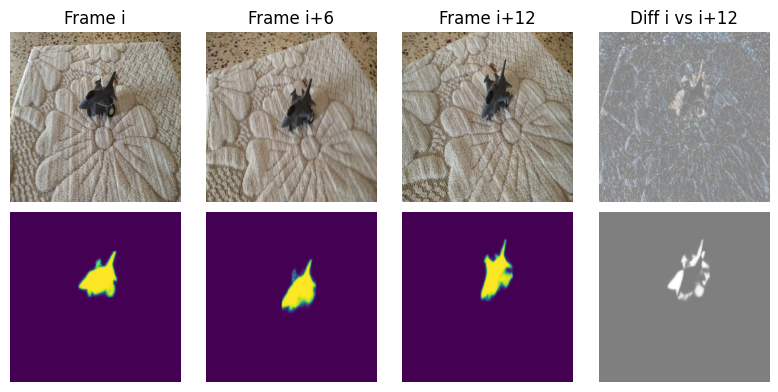

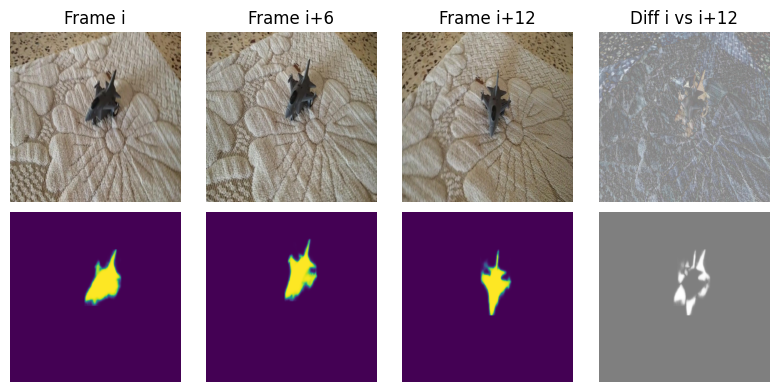

In [ ]:
steps = 6
zip_items = zip(
    set_list["train"][           ::steps], 
    set_list["train"][(steps*1)-1::steps], 
    set_list["train"][(steps*2)-1::steps]
)

base_path = "/visinf/home/lab_mozkan/computer-vision-proj-lab/data/co3d_data"
def plot_im(path: str, mask=False, base_path=base_path):
    path = base_path + "/" + path
    if mask:
        path = path.replace("images", "masks").replace("jpg", "png")

    image = im_utils.read_im(path)
    image = torch.einsum("chw->hwc", image) / 2 + 0.5

    if mask:
        plt.imshow(torch.mean(image, dim=-1))
    else:
        plt.imshow(image)
    plt.axis("off")
    return None

def plot_diff(path1, path2, mask=False, base_path=base_path):
    path1 = base_path + "/" + path1
    path2 = base_path + "/" + path2

    if mask:
        path1 = path1.replace("images", "masks").replace("jpg", "png")
        path2 = path2.replace("images", "masks").replace("jpg", "png")

    im1 = im_utils.read_im(path1)
    im2 = im_utils.read_im(path2)
    diff_im = torch.abs(im1 - im2)
    diff_im = (diff_im - diff_im.min()) / (diff_im.max() - diff_im.min())

    image = torch.einsum("chw->hwc", diff_im) / 2 + 0.5
    plt.imshow(image, cmap="jet")
    plt.axis("off")


index = 0
for (i1, i2, i3) in zip_items:
    plt.figure(figsize=(8, 4))
    plt.subplot(2,4,1); plot_im(i1[2]); plt.title("Frame i")
    plt.subplot(2,4,2); plot_im(i2[2]); plt.title(f"Frame i+{steps}")
    plt.subplot(2,4,3); plot_im(i3[2]); plt.title(f"Frame i+{steps*2}")
    plt.subplot(2,4,4); plot_diff(i1[2], i3[2]); plt.title("Diff i vs i+12")

    plt.subplot(2,4,5); plot_im(i1[2], 1)
    plt.subplot(2,4,6); plot_im(i2[2], 1)
    plt.subplot(2,4,7); plot_im(i3[2], 1)
    plt.subplot(2,4,8); plot_diff(i1[2], i3[2], 1)
    plt.tight_layout()
    plt.show()
    index += 1

    if index == 3:
        break

In [4]:
model = "CompVis/stable-diffusion-v1-4"
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema")
pipe = StableDiffusionPipeline.from_pretrained(model, vae=vae)
pipe = pipe.to("cuda")

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 16.46it/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021840513..0.9846637].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06446719..1.1076679].


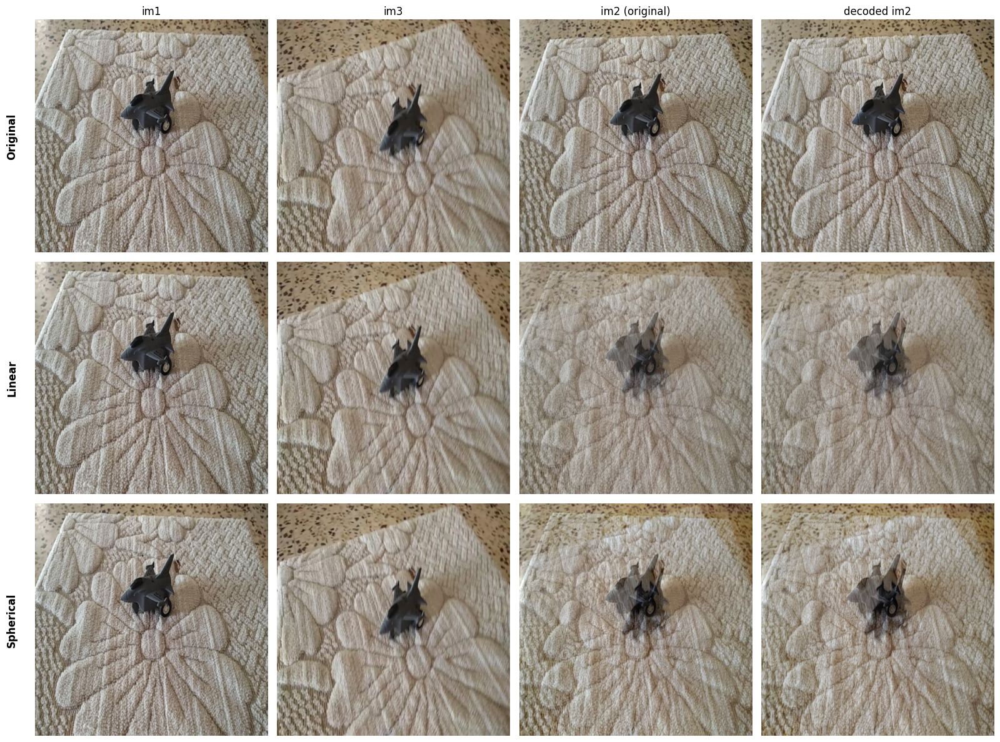

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.085164666..0.9846613].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0051962137..0.94501275].


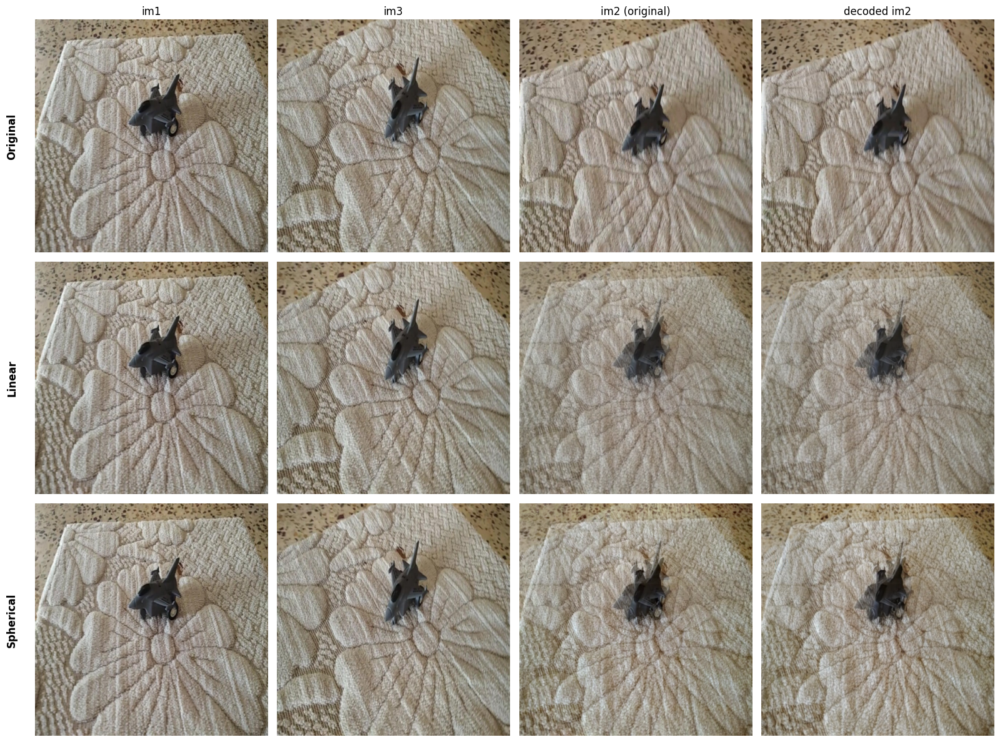

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09751177..0.89768726].


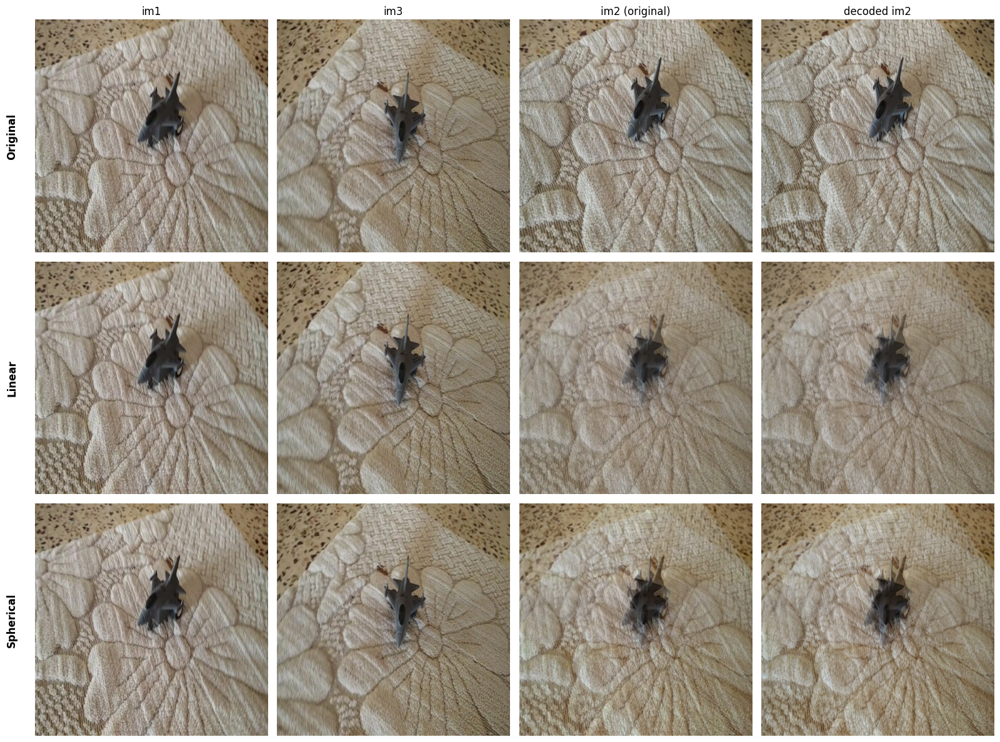

In [5]:
steps = 6
zip_items = zip(
    set_list["train"][::steps],
    set_list["train"][(steps * 1) - 1 :: steps],
    set_list["train"][(steps * 2) - 1 :: steps],
)

index = 0
for i1, i2, i3 in zip_items:
    plt.figure(figsize=(16, 12))

    # Load images
    paths = [base_path + "/" + item[2] for item in [i1, i2, i3]]
    im1, im2, im3 = [im_utils.read_im(path).unsqueeze(0) for path in paths]

    # Create interpolations
    im2_interp = im_utils.interpolate(im1, im3, 0.5, method="linear")
    im2_slerp = im_utils.interpolate(im1, im3, 0.5, method="spherical")

    # Encode all images
    images_gpu = [img.to(pipe.device) for img in [im1, im2, im3, im2_interp, im2_slerp]]
    with torch.no_grad():
        latents = [model_utils.encode(img, vae).to("cpu") for img in images_gpu]
        del images_gpu
        torch.cuda.empty_cache()

    # Decode target latents
    with torch.no_grad():
        decoded = [
            pipe.vae.decode(lat.to(pipe.device)).sample.cpu() / 2 + 0.5
            for lat in latents[1:]
        ]
        del latents
        torch.cuda.empty_cache()

    # Normalize for display
    display_imgs = [
        torch.einsum("bchw->hwc", img) / 2 + 0.5
        for img in [im1, im2, im3, im2_interp, im2_slerp]
    ]

    # Plot all rows
    titles = [
        ["im1", "im3", "im2 (original)", "decoded im2"],
        ["im1", "im3", "linear interp", "decoded linear"],
        ["im1", "im3", "spherical interp", "decoded spherical"],
    ]
    row_labels = ["Original", "Linear", "Spherical"]
    plot_data = [
        [
            display_imgs[0],
            display_imgs[2],
            display_imgs[1],
            torch.einsum("bchw->hwc", decoded[0]),
        ],
        [
            display_imgs[0],
            display_imgs[2],
            display_imgs[3],
            torch.einsum("bchw->hwc", decoded[2]),
        ],
        [
            display_imgs[0],
            display_imgs[2],
            display_imgs[4],
            torch.einsum("bchw->hwc", decoded[3]),
        ],
    ]

    for row in range(3):
        for col in range(4):
            plt.subplot(3, 4, row * 4 + col + 1)
            plt.imshow(plot_data[row][col])
            plt.axis("off")
            if row == 0:
                plt.title(titles[row][col])
            if col == 0:
                plt.text(
                    -0.1,
                    0.5,
                    row_labels[row],
                    rotation=90,
                    va="center",
                    ha="center",
                    transform=plt.gca().transAxes,
                    fontsize=12,
                    weight="bold",
                )

    plt.tight_layout()
    plt.show()
    index += 1
    if index == 3:
        break

In [24]:
reload(experiments)

<module 'src.experiments' from '/visinf/home/lab_mozkan/computer-vision-proj-lab/src/experiments.py'>

In [25]:
result = experiments.calculate_interpolation_mse(
    set_list, pipe, steps=6, num_samples=None, base_path=base_path
)

Processing interpolations: 100%|██████████| 16/16 [00:18<00:00,  1.13s/it]


In [32]:
reload(plot_utils)

<module 'src.utils.plot' from '/visinf/home/lab_mozkan/computer-vision-proj-lab/src/utils/plot.py'>

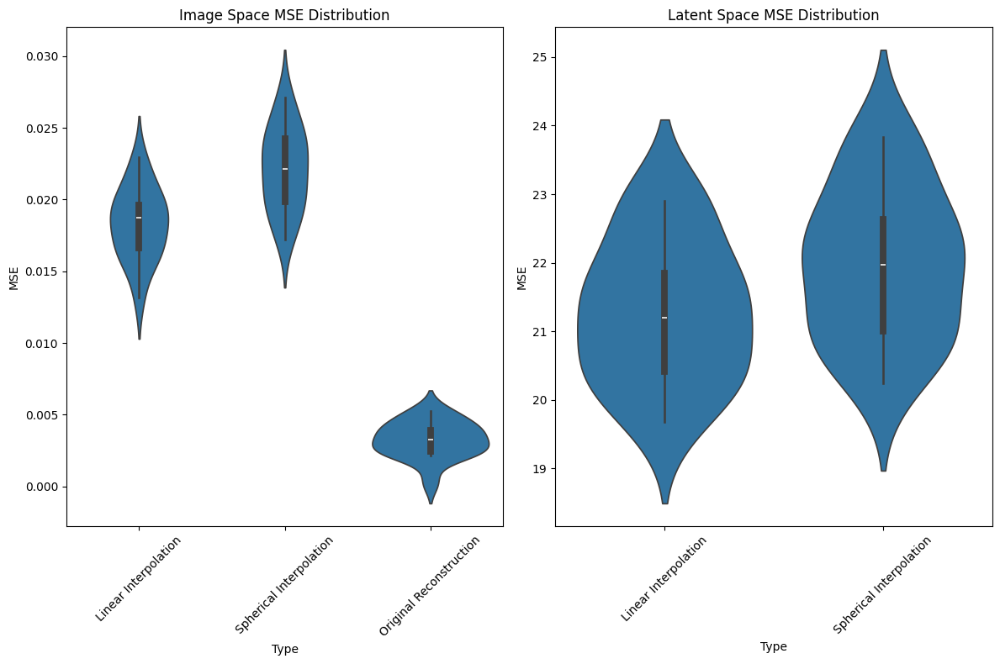

In [33]:
plot_utils.plot_mse_violin(result)

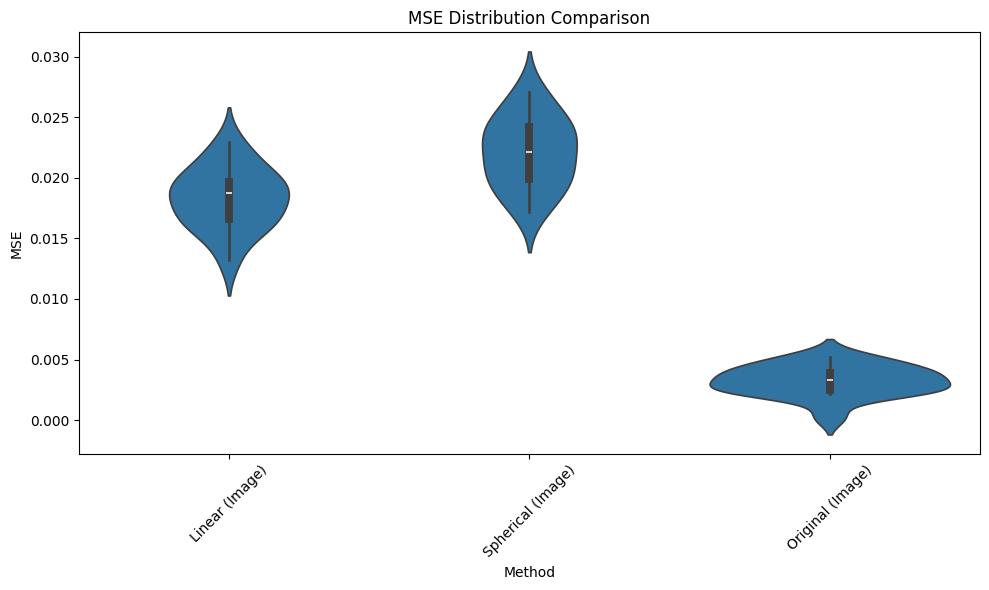

In [34]:
plot_utils.plot_mse_comparison(result)

In [40]:
reload(plot_utils)

<module 'src.utils.plot' from '/visinf/home/lab_mozkan/computer-vision-proj-lab/src/utils/plot.py'>

In [37]:
results_latent = experiments.calculate_latent_interpolation_mse(
    set_list, pipe, steps=6, num_samples=None, base_path=base_path
)

Processing latent interpolations: 100%|██████████| 16/16 [00:21<00:00,  1.31s/it]


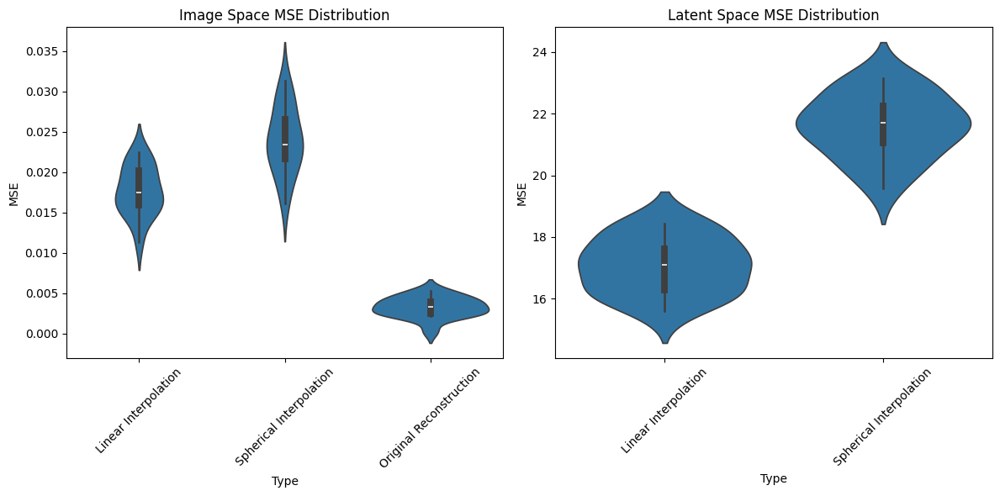

In [39]:
plot_utils.plot_mse_violin(results_latent, figsize=(12, 6))

In [45]:
reload(plot_utils)

<module 'src.utils.plot' from '/visinf/home/lab_mozkan/computer-vision-proj-lab/src/utils/plot.py'>

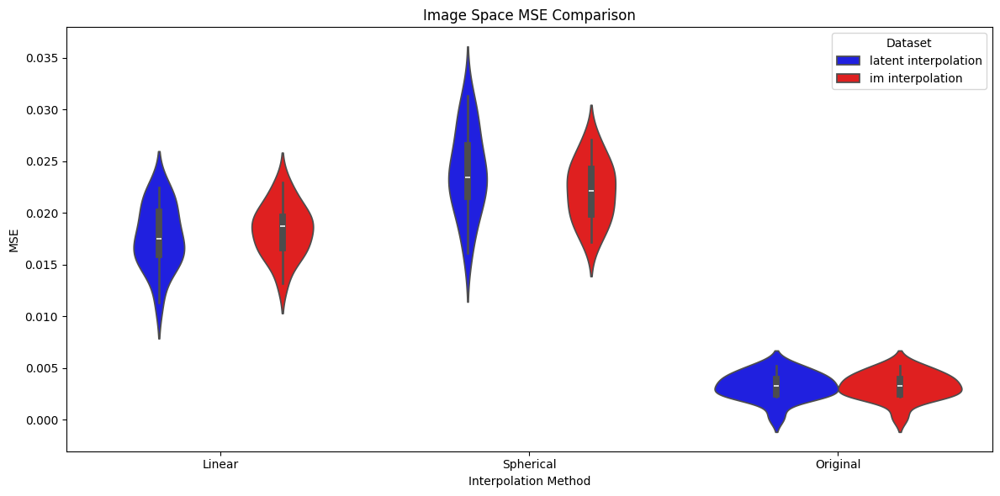

In [ ]:
plot_utils.plot_image_mse_comparison(
    result, 
    results_latent, 
    label2="im interpolation",
    label1="latent interpolation", 
    figsize=(12, 4)
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0012566447..0.9602338].


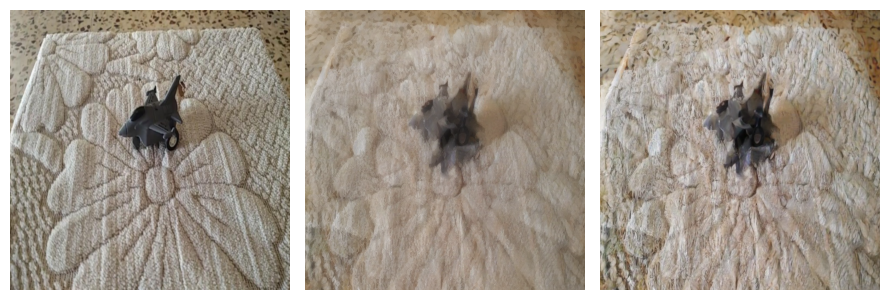

In [ ]:
steps = 6
zip_items = zip(
    set_list["train"][::steps],
    set_list["train"][(steps * 1) - 1 :: steps],
    set_list["train"][(steps * 2) - 1 :: steps],
)

index = 0
for i1, i2, i3 in zip_items:
    path1 = base_path + "/" + i1[2]
    path3 = base_path + "/" + i3[2]

    im1 = im_utils.read_im(path1).unsqueeze(0).to(pipe.device)
    im3 = im_utils.read_im(path3).unsqueeze(0).to(pipe.device)

    with torch.no_grad():
        l1 = model_utils.encode(im1, vae).to("cpu")
        l3 = model_utils.encode(im3, vae).to("cpu")
        del im1, im2, im3
        torch.cuda.empty_cache()

    l2_lin = im_utils.interpolate(l1, l3, 0.5, method="linear")
    l2_slerp = im_utils.interpolate(l1, l3, 0.5, method="spherical")

    with torch.no_grad():
        im2_lin = pipe.vae.decode(l2_lin.to(pipe.device))
        im2_slerp = pipe.vae.decode(l2_slerp.to(pipe.device))

        plot_im2_lin = im2_lin.sample.cpu() / 2 + 0.5
        plot_im2_slerp = im2_slerp.sample.cpu() / 2 + 0.5

        del im2_lin, im2_slerp, l2_lin, l2_slerp
        torch.cuda.empty_cache()

    plt.figure(figsize=(9, 4))

    source_path = base_path + "/" + i2[2]
    im_source = im_utils.read_im(source_path).cpu()
    im_source = im_source / 2 + 0.5
    plt.subplot(1, 3, 1)
    plt.imshow(torch.einsum("chw->hwc", im_source))
    plt.axis("off")
    plt.subplot(1, 3, 2)
    plt.imshow(torch.einsum("bchw->hwc", plot_im2_lin))
    plt.axis("off")
    plt.subplot(1, 3, 3)
    plt.imshow(torch.einsum("bchw->hwc", plot_im2_slerp))
    plt.axis("off")

    plt.tight_layout()
    plt.show()
    break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0012509227..0.9602283].


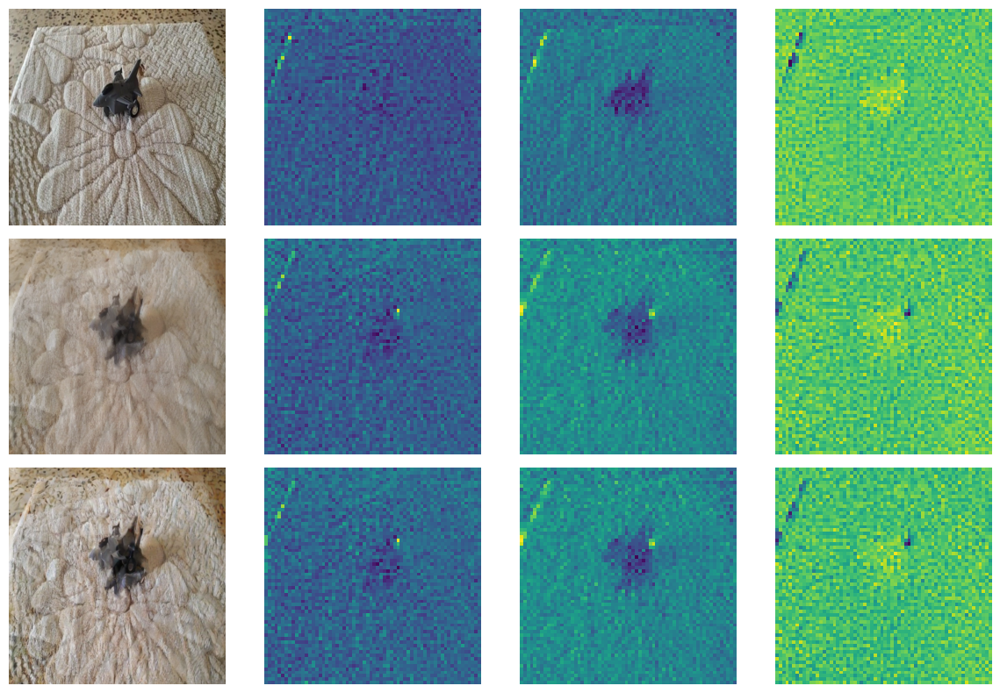

In [ ]:
steps = 6
zip_items = zip(
    set_list["train"][::steps],
    set_list["train"][(steps * 1) - 1 :: steps],
    set_list["train"][(steps * 2) - 1 :: steps],
)

index = 0
for i1, i2, i3 in zip_items:
    plt.figure(figsize=(12, 8))

    path1 = base_path + "/" + i1[2]
    path2 = base_path + "/" + i2[2]
    path3 = base_path + "/" + i3[2]

    im1 = im_utils.read_im(path1).unsqueeze(0).to(pipe.device)
    im2 = im_utils.read_im(path2).unsqueeze(0).to(pipe.device)
    im3 = im_utils.read_im(path3).unsqueeze(0).to(pipe.device)

    with torch.no_grad():
        l1 = model_utils.encode(im1, vae).to("cpu")
        l2 = model_utils.encode(im2, vae).to("cpu")
        l3 = model_utils.encode(im3, vae).to("cpu")
        del im1, im2, im3
        torch.cuda.empty_cache()

    l2_lin = im_utils.interpolate(l1, l3, 0.5, method="linear")
    l2_slerp = im_utils.interpolate(l1, l3, 0.5, method="spherical")

    for i, latent in enumerate([l2, l2_lin, l2_slerp]):
        plt.subplot(3, 4, 2 + (i * 4))
        plot_utils.plot_latent(latent, "index", 0)
        plt.subplot(3, 4, 3 + (i * 4))
        plot_utils.plot_latent(latent, "index", 1)
        plt.subplot(3, 4, 4 + (i * 4))
        plot_utils.plot_latent(latent, "index", 2)

    # plt.subplot(2,3,4); plot_utils.plot_latent(l2, "mean")
    # plt.subplot(2,3,5); plot_utils.plot_latent(l2_lin, "mean")
    # plt.subplot(2,3,6); plot_utils.plot_latent(l2_slerp, "mean")

    with torch.no_grad():
        im2_lin = pipe.vae.decode(l2_lin.to(pipe.device))
        im2_slerp = pipe.vae.decode(l2_slerp.to(pipe.device))

        plot_im2_lin = im2_lin.sample.cpu() / 2 + 0.5
        plot_im2_slerp = im2_slerp.sample.cpu() / 2 + 0.5

        del im2_lin, im2_slerp, l2_lin, l2_slerp
        torch.cuda.empty_cache()

    source_path = base_path + "/" + i2[2]
    im_source = im_utils.read_im(source_path).cpu()
    im_source = im_source / 2 + 0.5
    for i, result in enumerate([im_source, plot_im2_lin[0], plot_im2_slerp[0]]):
        plt.subplot(3, 4, 1 + (4 * i))
        plt.imshow(torch.einsum("chw->hwc", result))
        plt.axis("off")

    plt.tight_layout()
    plt.show()
    break

In [48]:
set_listTrain = read_set_list(
    base_path + "/toytrain/set_lists/set_lists_manyview_test_0.json"
)
set_listTrain["train"][:10]

[['579_85857_169792', 1, 'toytrain/579_85857_169792/images/frame000001.jpg'],
 ['579_85857_169792', 2, 'toytrain/579_85857_169792/images/frame000002.jpg'],
 ['579_85857_169792', 3, 'toytrain/579_85857_169792/images/frame000003.jpg'],
 ['579_85857_169792', 4, 'toytrain/579_85857_169792/images/frame000004.jpg'],
 ['579_85857_169792', 5, 'toytrain/579_85857_169792/images/frame000005.jpg'],
 ['579_85857_169792', 11, 'toytrain/579_85857_169792/images/frame000011.jpg'],
 ['579_85857_169792', 12, 'toytrain/579_85857_169792/images/frame000012.jpg'],
 ['579_85857_169792', 13, 'toytrain/579_85857_169792/images/frame000013.jpg'],
 ['579_85857_169792', 14, 'toytrain/579_85857_169792/images/frame000014.jpg'],
 ['579_85857_169792', 15, 'toytrain/579_85857_169792/images/frame000015.jpg']]

In [58]:
result = experiments.calculate_interpolation_mse(
    set_listTrain, pipe, steps=6, num_samples=None, base_path=base_path
)

results_latent = experiments.calculate_latent_interpolation_mse(
    set_listTrain, pipe, steps=6, num_samples=None, base_path=base_path
)

Processing latent interpolations: 100%|██████████| 16/16 [00:18<00:00,  1.14s/it]


In [60]:
reload(plot_utils)

<module 'src.utils.plot' from '/visinf/home/lab_mozkan/computer-vision-proj-lab/src/utils/plot.py'>

TypeError: Axes.bxp() got an unexpected keyword argument 'split'

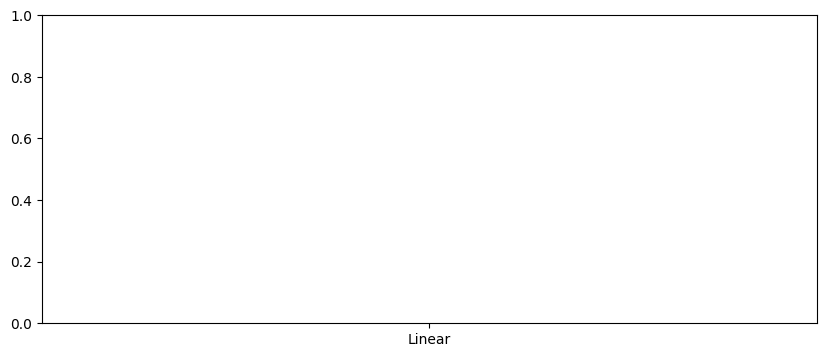

In [59]:
plot_utils.plot_image_mse_comparison(
    result, 
    results_latent, 
    label2="im interpolation",
    label1="latent interpolation", 
    figsize=(10, 4)
)

plot_utils.plot_latent_mse_comparison(
    result, 
    results_latent, 
    label2="im interpolation",
    label1="latent interpolation", 
    figsize=(8, 4)
)

Processing latent interpolations: 100%|██████████| 33/33 [00:37<00:00,  1.14s/it]


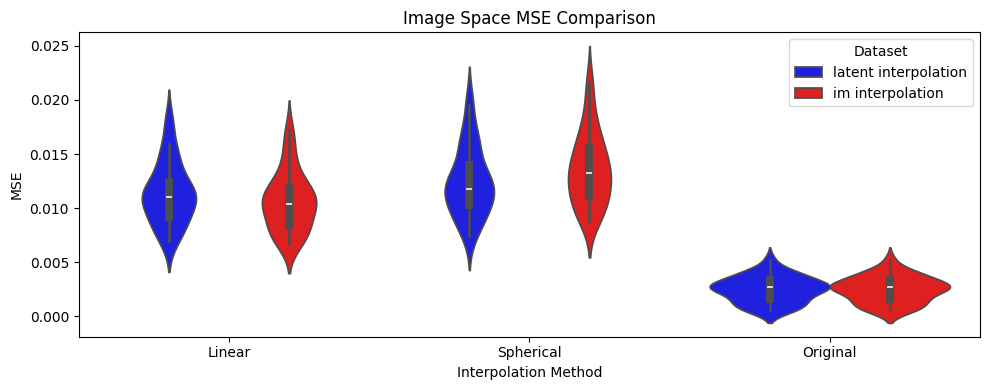

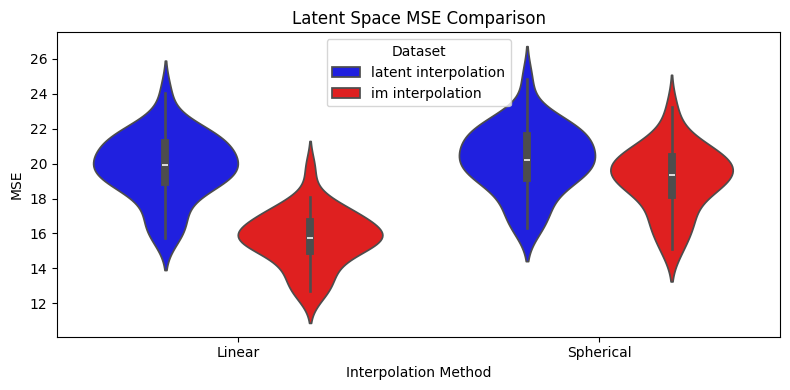

In [55]:
result = experiments.calculate_interpolation_mse(
    set_listTrain, pipe, steps=3, num_samples=None, base_path=base_path
)

results_latent = experiments.calculate_latent_interpolation_mse(
    set_listTrain, pipe, steps=3, num_samples=None, base_path=base_path
)

plot_utils.plot_image_mse_comparison(
    result, 
    results_latent, 
    label2="im interpolation",
    label1="latent interpolation", 
    figsize=(10, 4)
)

plot_utils.plot_latent_mse_comparison(
    result, 
    results_latent, 
    label2="im interpolation",
    label1="latent interpolation", 
    figsize=(8, 4)
)

Processing latent interpolations: 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


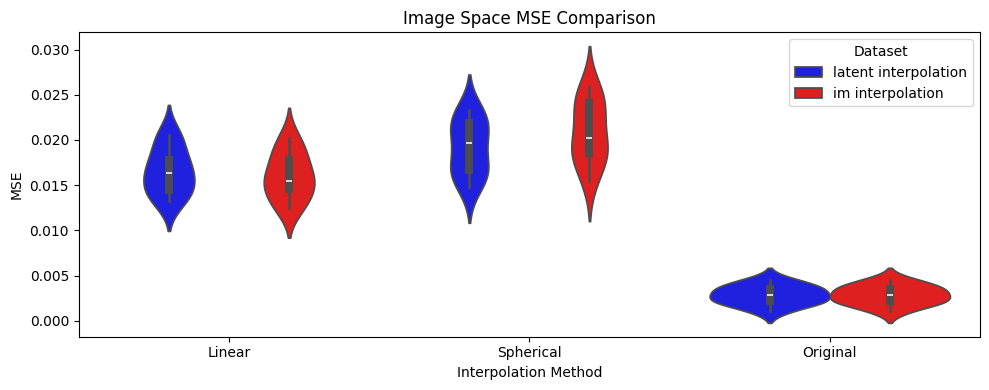

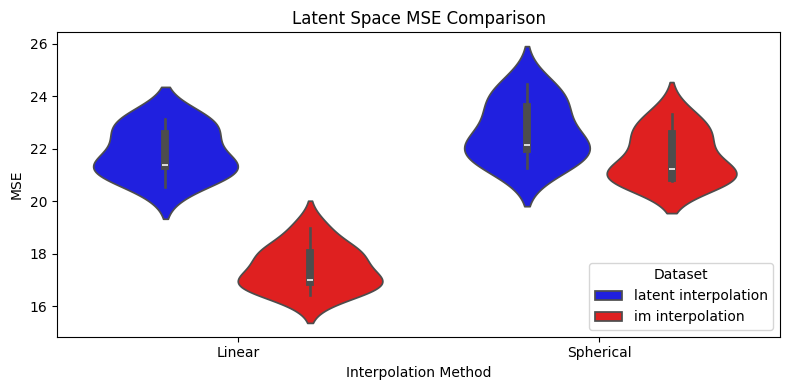

In [56]:
result = experiments.calculate_interpolation_mse(
    set_listTrain, pipe, steps=10, num_samples=None, base_path=base_path
)

results_latent = experiments.calculate_latent_interpolation_mse(
    set_listTrain, pipe, steps=10, num_samples=None, base_path=base_path
)

plot_utils.plot_image_mse_comparison(
    result, 
    results_latent, 
    label2="im interpolation",
    label1="latent interpolation", 
    figsize=(10, 4)
)

plot_utils.plot_latent_mse_comparison(
    result, 
    results_latent, 
    label2="im interpolation",
    label1="latent interpolation", 
    figsize=(8, 4)
)

In [61]:
reload(experiments)

<module 'src.experiments' from '/visinf/home/lab_mozkan/computer-vision-proj-lab/src/experiments.py'>

In [63]:
result = experiments.calculate_interpolation_mse(
    set_listTrain, pipe, steps=6, num_samples=None, base_path=base_path
)

result_masked = experiments.calculate_interpolation_mse(
    set_listTrain, pipe, steps=6, num_samples=None, base_path=base_path, use_mask=True
)

Processing interpolations: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it]


In [67]:
reload(plot_utils)

<module 'src.utils.plot' from '/visinf/home/lab_mozkan/computer-vision-proj-lab/src/utils/plot.py'>

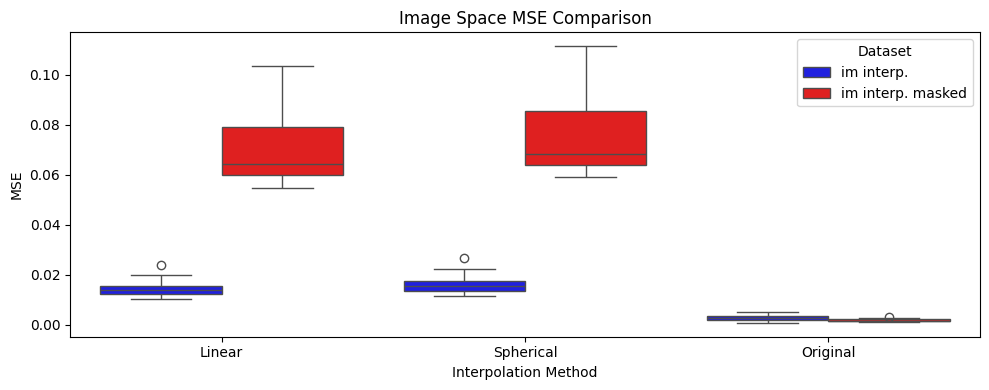

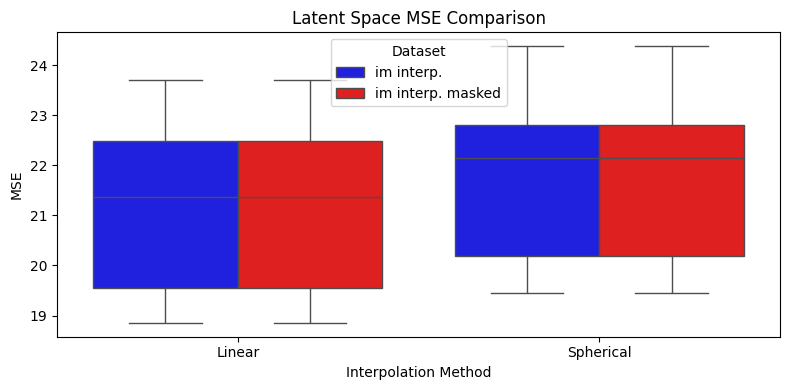

In [68]:

plot_utils.plot_image_mse_comparison(
    result, 
    result_masked, 
    label1="im interp.", 
    label2="im interp. masked",
    figsize=(10, 4)
)

plot_utils.plot_latent_mse_comparison(
    result, 
    result_masked, 
    label1="im interp.",
    label2="im interp. masked",
    figsize=(8, 4)
)